#### **01-EDA_2 (Multivariate analysis and Feature relationships)**
#### Project name: **Telecom Customer Churn Prediction**
#### Author: **Fausto Pucheta Fortin**

#### **Introduction:** 
This notebook is the continuation of 01-EDA_1. \
After the cleaning phase, the purpose of this notebook will be to find any underlying pattern in data using bivariate and multivariate analysis. Any feature relationship found will set up the basis for the next phase which will be *Feature Engineer*.

#### **Tasks:**
1. Feature Relationships:
	1. Bivariate analysis:
		1. Distribution of continuous features vs churn_status using histograms and box plots.
		2. Distribution of categorical features vs churn_status using bar plots.
	2. Multivariate analysis:
		1. Correlation coefficient using heatmap.
		2. Pairwise relationships between variables using pairplot().


#### **Findings:**
1. Customers with *age* **> 50** are less likely to *churn*.
2. Customers that made *support calls* **> 4** were more likely to *churn*.
3. Customers with a *payment delay* **> 20 months** were more likely to *churn*.
4. Customers who had spent **$450 or less** were likelier to *churn*.
5. Looking at 'Gender', **women** were the customers more likely to *churn*. 
6. In 'Contract Length', customers with a **monthly** contract length were likelier to *churn*.
7. Customers who hadn't call support assistance after **14 months** were more likely to *churn*.

#### **Further steps:** Feature engineer (01-Feature_Engineer.ipynb) 
1. Age Binning: \
For the model to better understand the impact of age on churn I will create three 'age' categories: **Young Adults** (< 30 yo), **Middle-age Adults** (30 - 50 yo), and **Seniors** (> 50 yo).

2. Binary Features:
- High Support Calls feature: \
A new **binary feature** called *high_support_calls* will be created. This feature will take the value of 1 if 'support calls' are > 4 and 0 otherwise. This way the model will capture the impact of high support call volumes on churn.

- High Payment Delay feature: \
Similar to the support calls threshold, a new **binary feature** called *high_payment_delay* that takes the value 1 if 'payment delay' > 20 weeks and 0 otherwise will be created. This can indicate customers who have significantly delayed payments.

- High Spender feature: \
This will be created based on a threshold of > $450 of 'Total Spent', taking **1** for customers who are high spenders and **0** otherwise.

- Gender: \
It will be transformed into a binary column: **0** for males, and **1** for females.

- Month Contract feature: \
A new feature called month_contract will be created, taking the vale of **1** for customers that have a monthly contract and **0** otherwise.

- Low Interaction Customer feature: \
This feature will represent the customers who hadn't call support assistance in the las 14 months, taking **1** as low interaction customers, and **0** otherwise.

3. Interaction Features: 
 - A new feature called *age_support_calls_interaction* will be created multiplying 'age' and 'support calls'. This might help to identify whether certain age groups tend to make more support calls and how that relates to churn.
 - Another new feature called *payment_delay_to_total_spent_ratio* will be created dividing 'payment delay' with 'total spent'. With this feature we'll asses the impact of payment delays relative to the amount spent by the customer.

In [1]:
import sys
sys.path.append('../src/functions')

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import LabelEncoder

# Stratified sampling
from sklearn.model_selection import train_test_split

# EDA functions
from plot_functions import *

# Analysis libraries
import numpy as np
import pandas as pd

# Visualization libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Data
df = pd.read_pickle("../data/processed/imputed_df.pkl")

### 1. Feature Relationships

1.1. Bivariate analysis

1.1.1. Distribution of continuous features vs churn_status

c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as

<module 'matplotlib.pyplot' from 'c:\\Users\\Fausto\\Telecom-Customer-Churn-Project\\churnvenv\\lib\\site-packages\\matplotlib\\pyplot.py'>

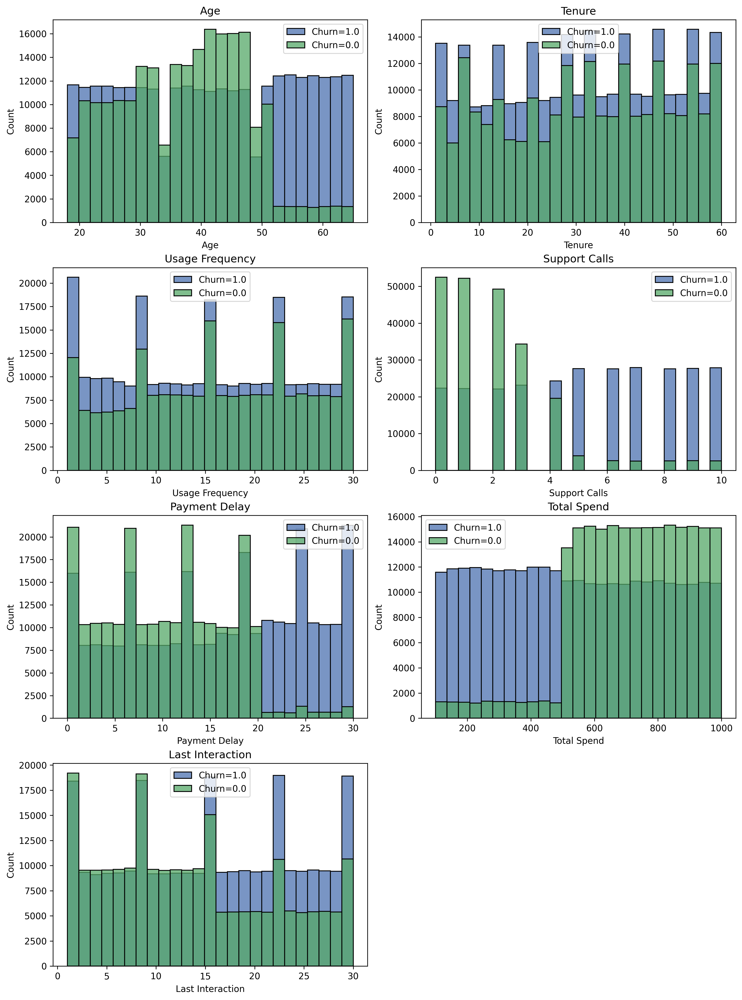

In [2]:
biv_grouped_histograms(df, 'Churn')

c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype

[]

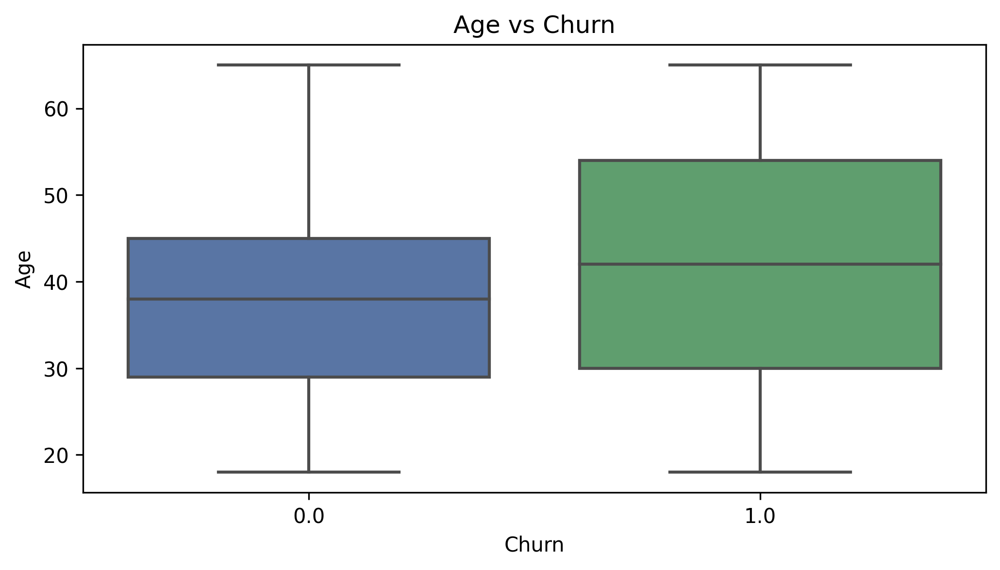

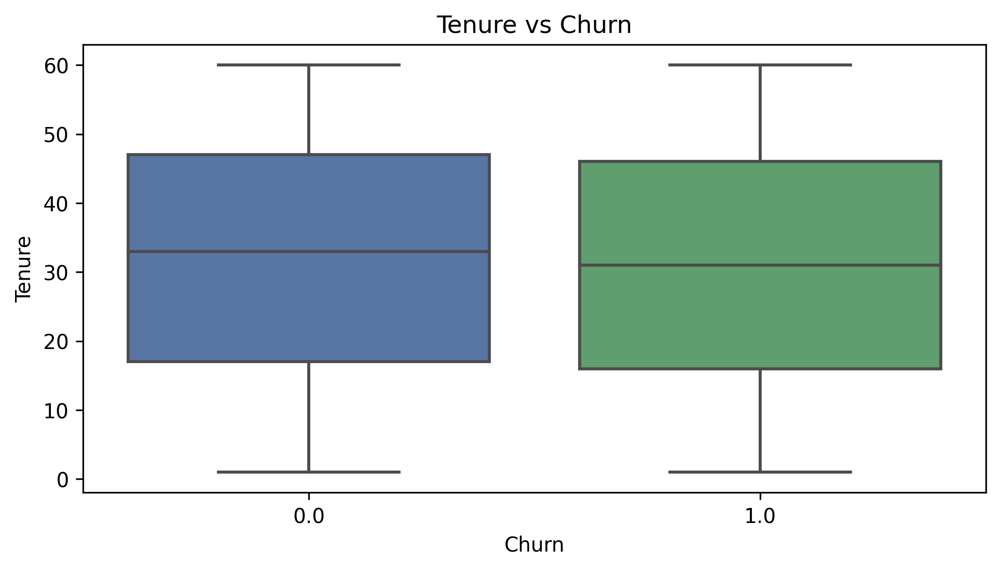

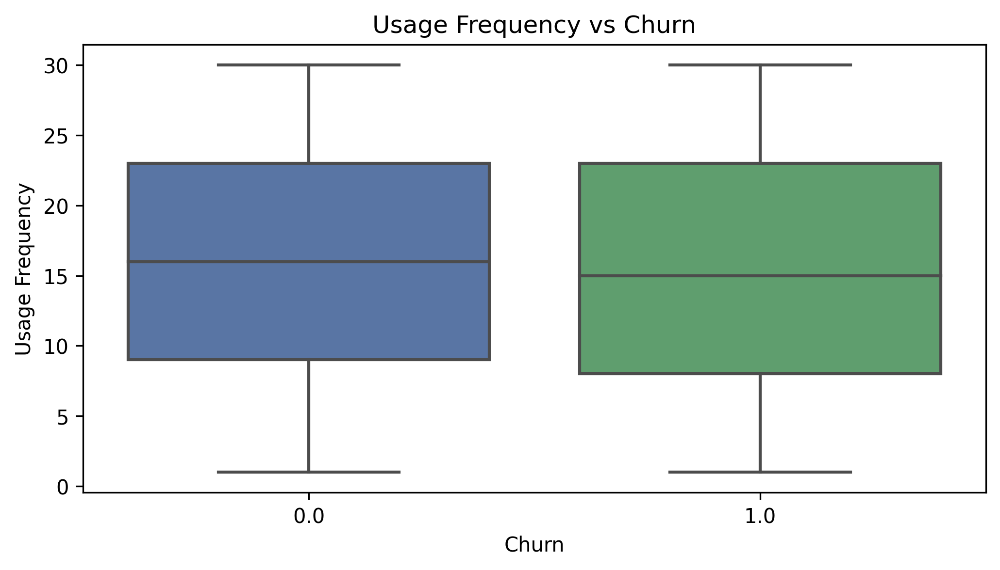

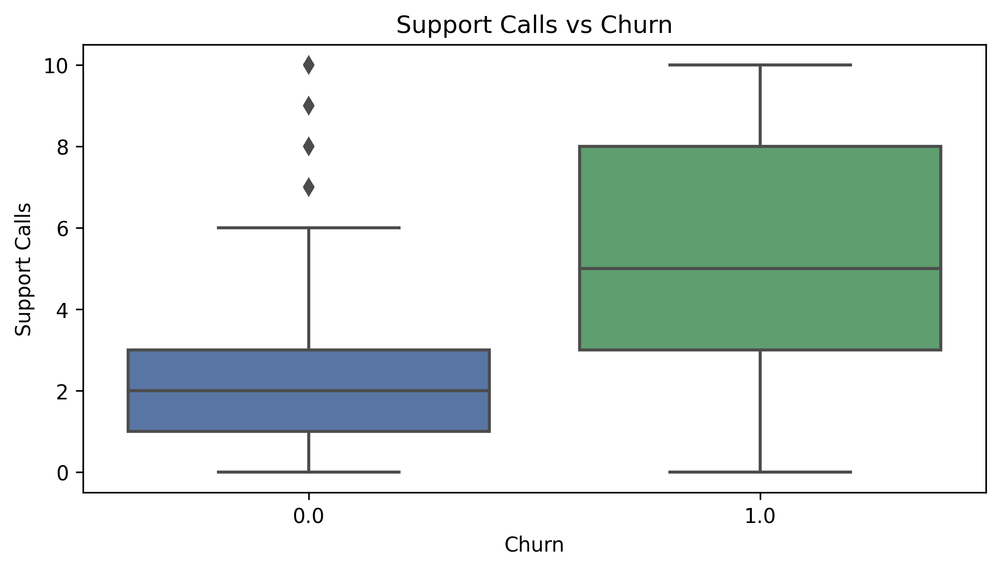

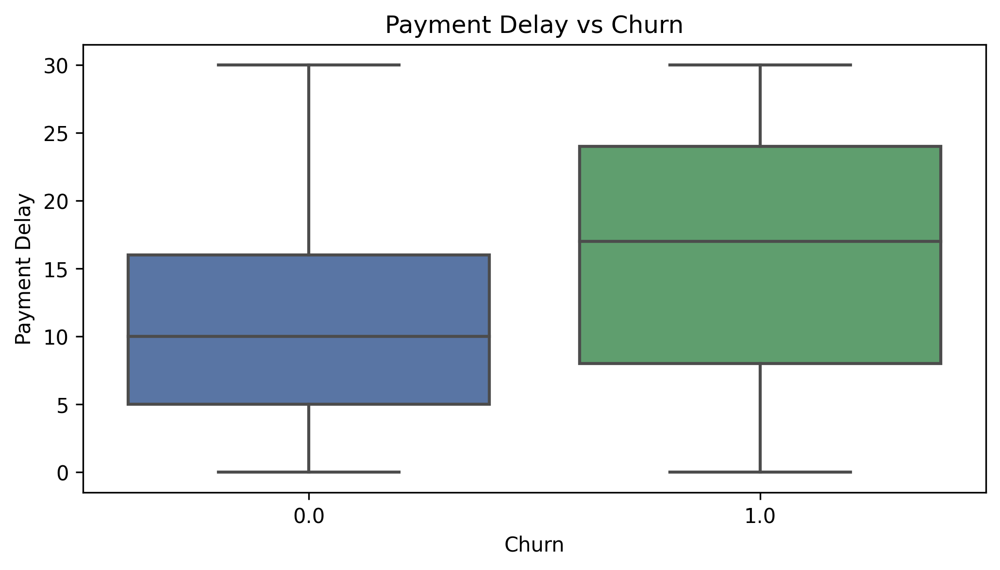

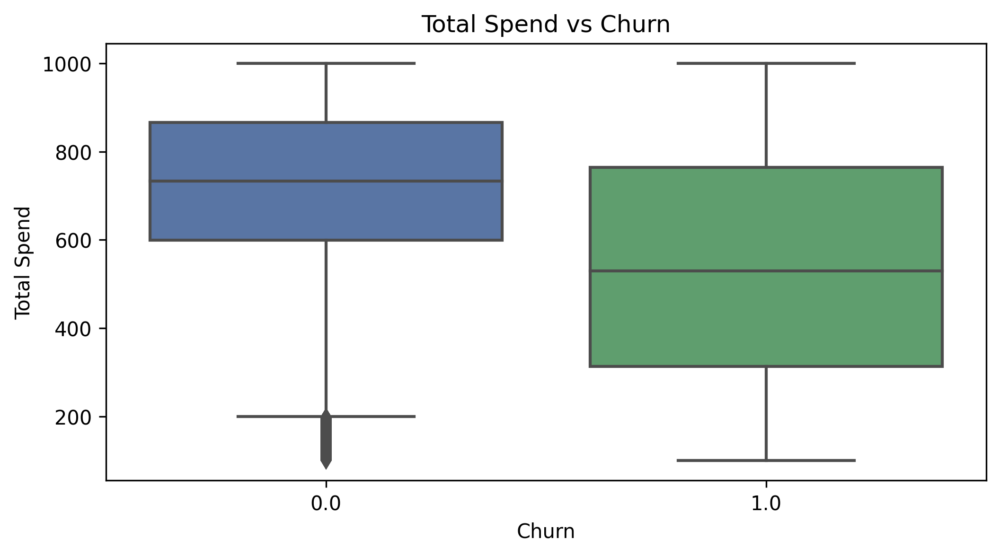

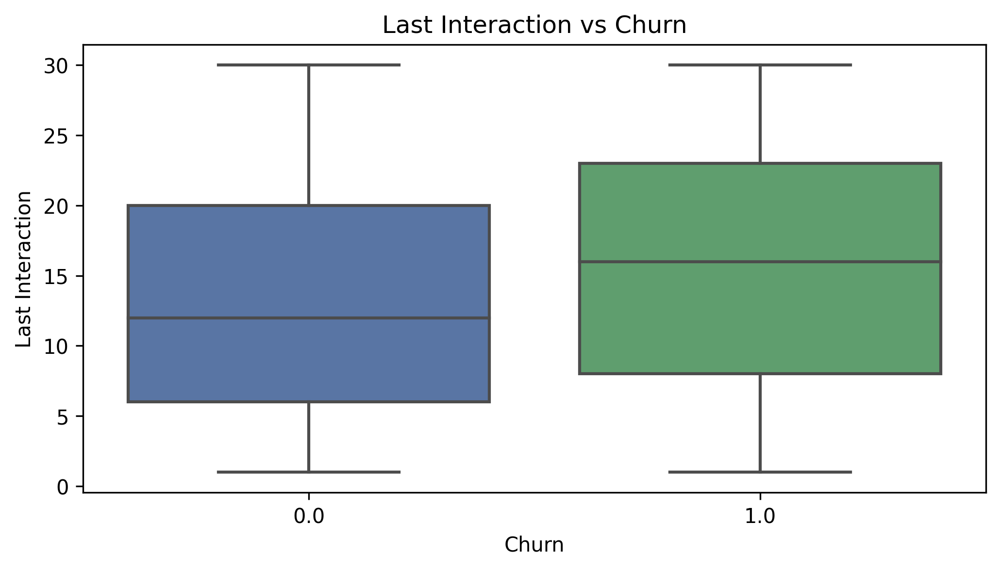

In [3]:
biv_grouped_boxplots(df, 'Churn')

2.1.2. Distribution of categorical features vs churn_status

c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype

[]

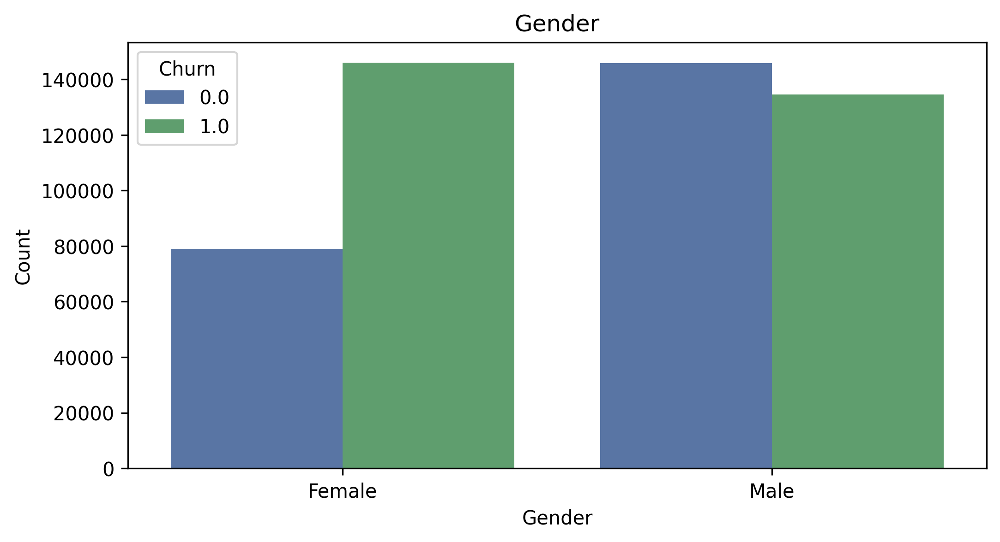

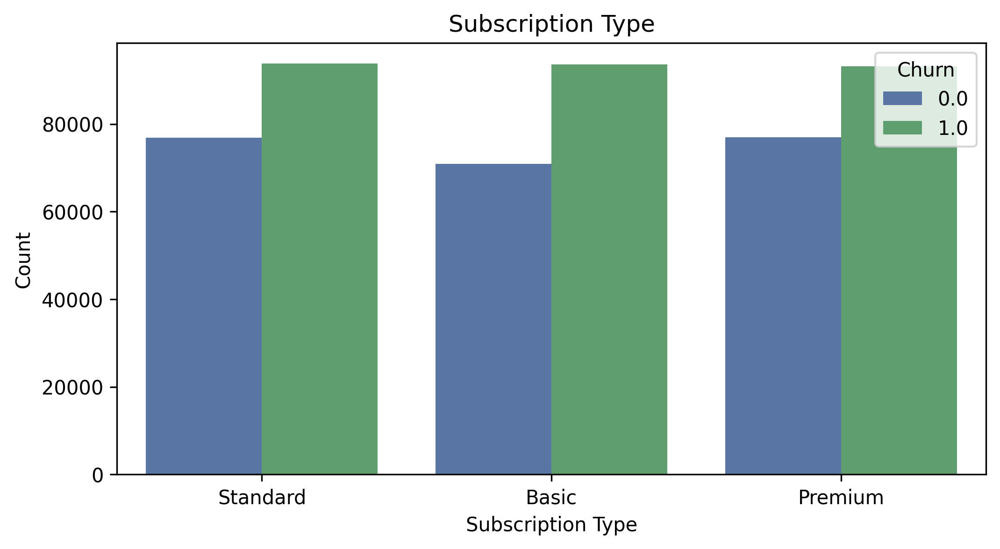

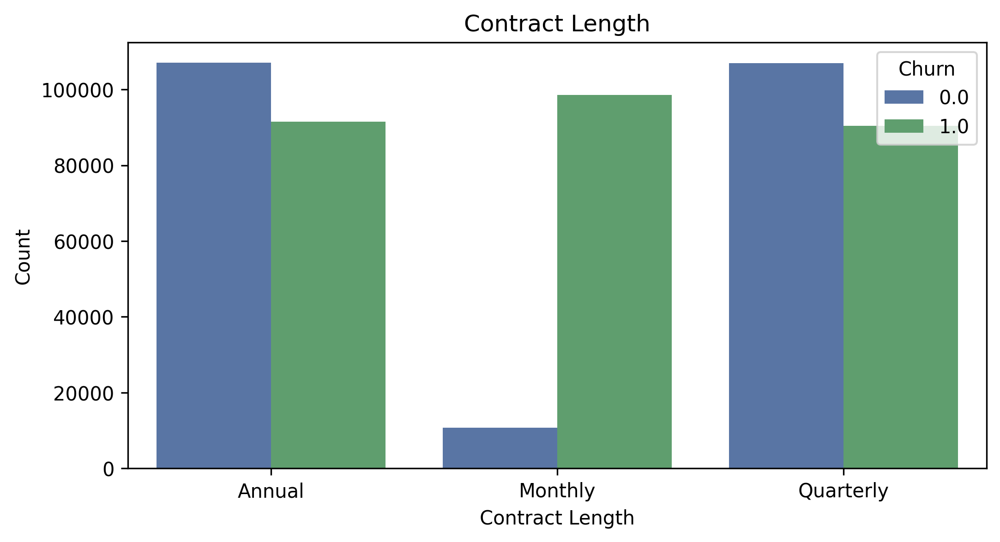

In [2]:
biv_grouped_barplots(df, 'Churn')

2.2. Multivariate analysis

2.2.1. Correlation coefficient using heatmap()

<module 'matplotlib.pyplot' from 'c:\\Users\\Fausto\\Telecom-Customer-Churn-Project\\churnvenv\\lib\\site-packages\\matplotlib\\pyplot.py'>

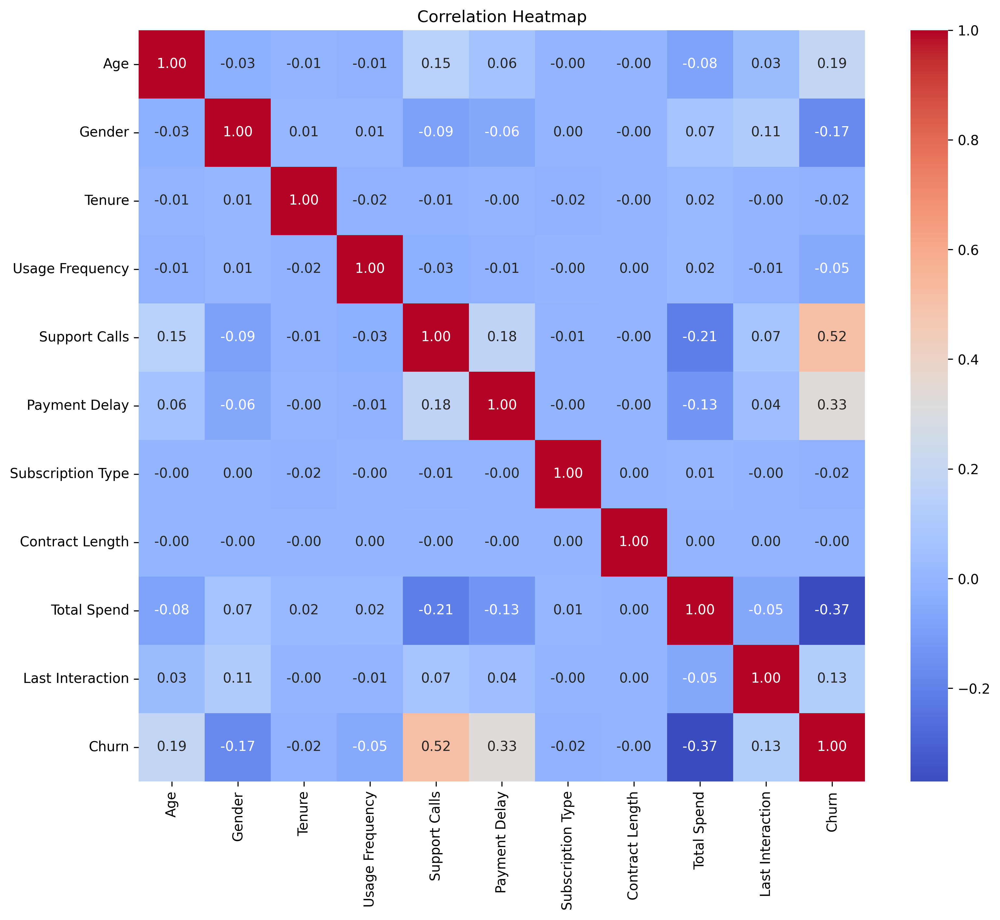

In [3]:
# Correlation Heatmap
plot_correlation_heatmap(df)

2.2.2. Pairwise relationships between variables using pairplot().

c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Fausto\Telecom-Customer-Churn-Project\churnvenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype

<Figure size 6000x6000 with 0 Axes>

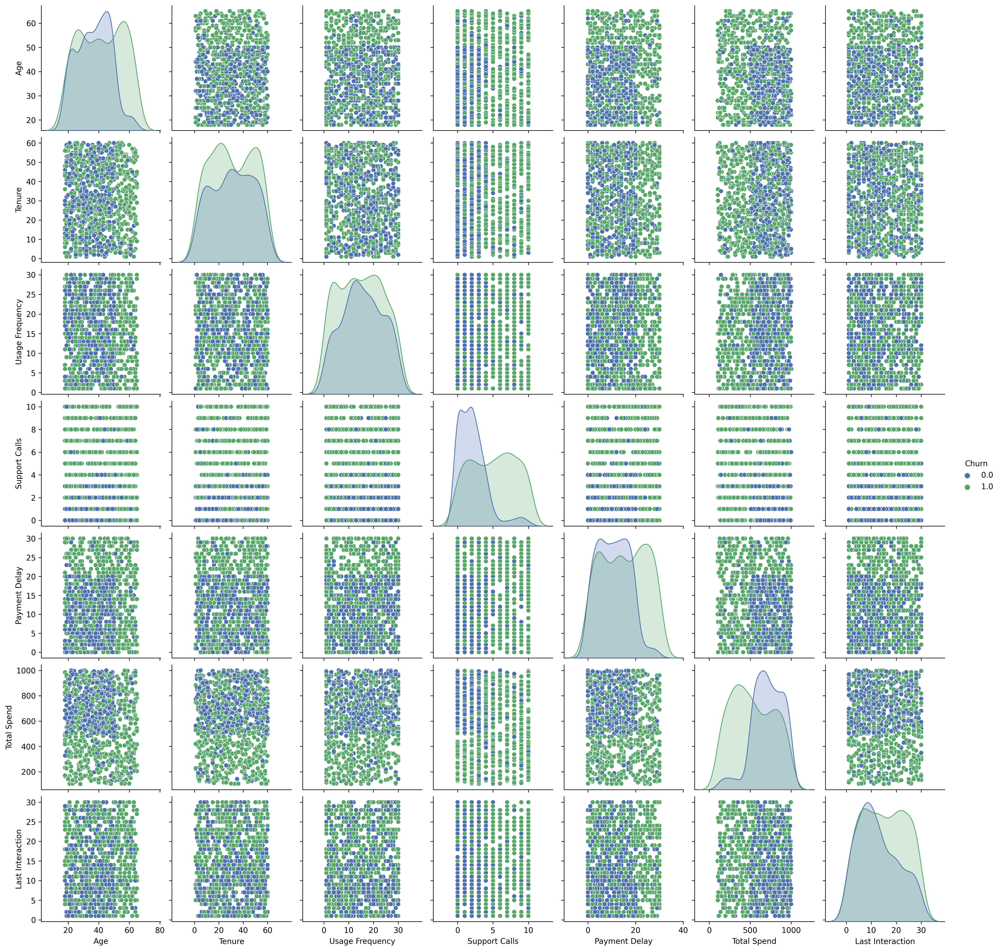

In [2]:
plot_pairplot(df, 'Churn')